**The changes from YOLO to YOLO v2:**
* **Batch Normalization:** YOLO V2 normalise the input layer by altering slightly and scaling the activations. Batch normalization decreases the shift in unit value in the hidden layer and by doing so it improves the stability of the neural network. By adding batch normalization to convolutional layers in the architecture MAP (mean average precision) has been improved by 2%. It also helped the model regularise and overfitting has been reduced overall.
* **Higher Resolution Classifier:** the input size in YOLO v2 has been increased from 224*224 to 448*448. The increase in the input size of the image has improved the MAP (mean average precision) upto 4%. This increase in input size is been applied while training the YOLO v2 architecture DarkNet 19 on ImageNet dataset.
* **Anchor Boxes:** one of the most notable changes which can visible in YOLO v2 is the introduction the anchor boxes. YOLO v2 does classification and prediction in a single framework. These anchor boxes are responsible for predicting bounding box and this anchor boxes are designed for a given dataset by using clustering(k-means clustering).
* **Fine-Grained Features:** one of the main issued that has to be addressed in the YOLO v1 is that detection of smaller objects on the image. This has been resolved in the YOLO v2 divides the image into 13*13 grid cells which is smaller when compared to its previous version. This enables the yolo v2 to identify or localize the smaller objects in the image and also effective with the larger objects.
* **Multi-Scale Training:** on YOLO v1 has a weakness detecting objects with different input sizes which says that if YOLO is trained with small images of a particular object it has issues detecting the same object on image of bigger size. This has been resolved to a great extent in YOLO v2 where it is trained with random images with different dimensions range between 320*320 to 608*608. This allows the network to learn and predict the objects from various input dimensions with accuracy.
* **Darknet 19:** YOLO v2 uses Darknet 19 architecture with 19 convolutional layers and 5 max pooling layers and a softmax layer for classification objects.  Darknet is a neural network framework written in Clanguage and CUDA. It’s really fast in object detection which is very important for predicting in real-time.

With the advancements in several categories in YOLO v2 is better, faster, and stronger. With Multi-Scale Training now the network is able to detect and classify objects with different configurations and dimensions. YOLO v2 has seen a great improvement in detecting smaller objects with much more accuracy which it lacked in its predecessor version.

**YOLO 4 & YOLO 5:**

As a modified version of YOLOv3, YOLO4. uses Cross Stage Partial Network (CSPNet)
in Darknet, creating a new feature extractor backbone called CSPDarknet53. The convolution
architecture is based on modified DenseNet. It transfers a copy of feature map from the
base layer to the next layer through dense block. The advantages of using DenseNet include
the diminishing gradient vanishing problems, boosting backpropagation, removal of the
computational bottleneck, and improved learning. Neck is composed of spatial pyramid
pooling (SPP) layer and PANet path aggregation. SPP layer and PANet path aggregation are
used for feature aggregation to improve the receptive field and short out important features
from the backbone. In addition, the head is composed of YOLO layer. First, the image
is fed to CSPDarknet53 for feature extraction and then fed to path aggregation network
PANet for fusion. Finally, YOLO layer generates the results, similar to YOLOv3 YOLOv4
uses bag of freebies and bag of specials to improve the algorithm performance.
Bag of freebies includes Complete IOU loss (CIOU), drop block regularization and different augmentation techniques. Bags of specials includes mish activation, Diou-NMS
and modified the path aggregation networks.

However, YOLOv5 is different from the previous releases. It utilizes PyTorch instead
of Darknet. It utilizes CSPDarknet53 as backbone. This backbone solves the repetitive
gradient information in large backbones and integrates gradient change into feature map
that reduces the inference speed, increases accuracy, and reduces the model size by decreasing the parameters. It uses path aggregation network (PANet) as neck to boost the
information flow. PANet adopts a new feature pyramid network (FPN) that includes
several bottom ups and top down layers. This improves the propagation of low level
features in the model. PANet improves the localization in lower layers, which enhances the
localization accuracy of the object. In addition, the head in YOLOv5 is the same as YOLOv4
and YOLOv3 which generates three different output of feature maps to achieve multi scale
prediction. It also helps to enhance the prediction of small to large objects efficiently in the
model. The image is fed to CSPDarknet53 for feature extraction and again fed to PANet for
feature fusion. Finally, the YOLO layer generates the results.

**Two-stage vs One-stage Detectors:**

In two-stage Detectors, first, the model proposes a set of regions of interests by select search or regional proposal network. The proposed regions are sparse as the potential bounding box candidates can be infinite. Then a classifier only processes the region candidates. But in one-stage Detectors Single convolutional network predicts the bounding boxes and the class probabilities for these boxes.

**Example of two-stage Detectors:** R-CNN family

**Examples of one-stage Detectors:** YOLO & SSD

**YOLO v5 implementation:**

Install Dependencies:

In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


In [ ]:
%cd /content
!curl -L "https://app.roboflow.com/ds/F2Eo4hPmah?key=8ZdNTyoAP8" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0    746      0  0:00:01  0:00:01 --:--:--   746
100 5698k  100 5698k    0     0  2279k      0  0:00:02  0:00:02 --:--:--  245M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/cap_100_jpg.rf.04d2e5f139a204fe67ba4a6e318b9352.jpg  
 extracting: test/images/cap_101_jpg.rf.bcafe407a27e06e31019d2802a5f267a.jpg  
 extracting: test/images/cap_102_jpg.rf.67265b95ec5339ff91158ab2ea35e9ed.jpg  
 extracting: test/images/cap_113_jpg.rf.85dd06988ea675614c4bb3698937e9e6.jpg  
 extracting: test/images/cap_121_jpg.rf.99cc4b1767233b440b7397bfe1f77bdf.jpg  
 extracting: test/images/cap_125_jpg.rf.1ba0709ce7f0a493a741cfdb1c2f996d.jpg  
 extracting: test/images/cap_12_jpg.rf.3188210d6200a6602a

In [ ]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['Caps']

In [ ]:
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

Train Custom YOLOv5 Detector:

In [ ]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
github: ⚠️ WARNING: code is out of date by 1006 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='../data.yaml', device='', entity=None, epochs=100, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5s_results', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Start Tensorboard with "tensorboard -

Evaluate Custom YOLOv5 Detector Performance:

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

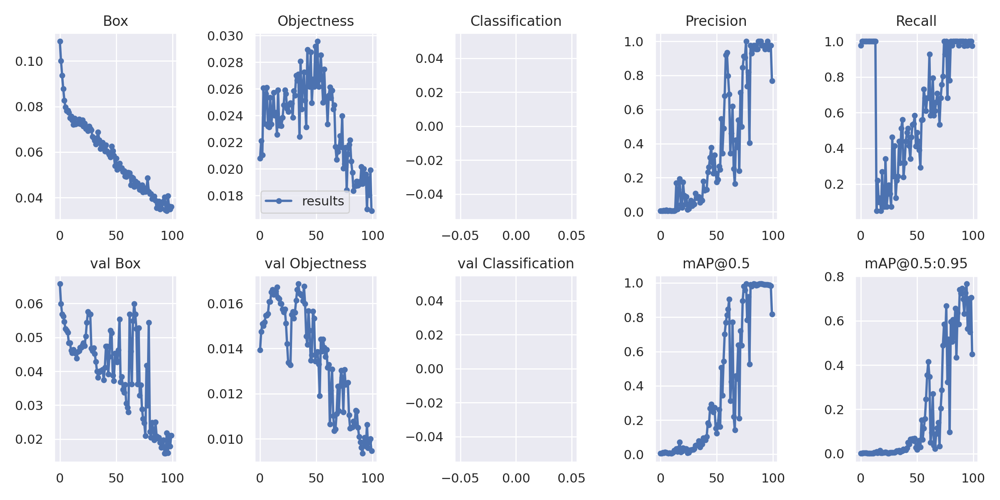

In [ ]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

Visualize Our Training Data with Labels:

GROUND TRUTH TRAINING DATA:


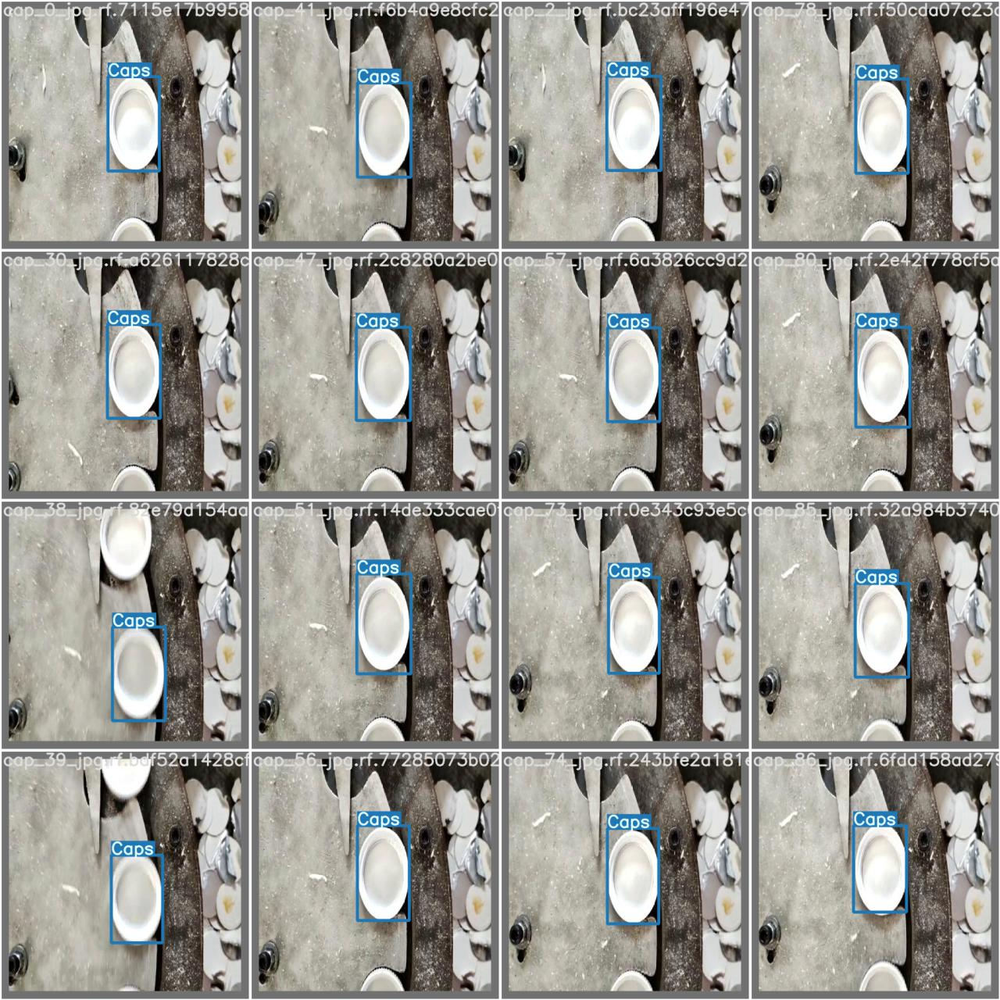

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/test_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


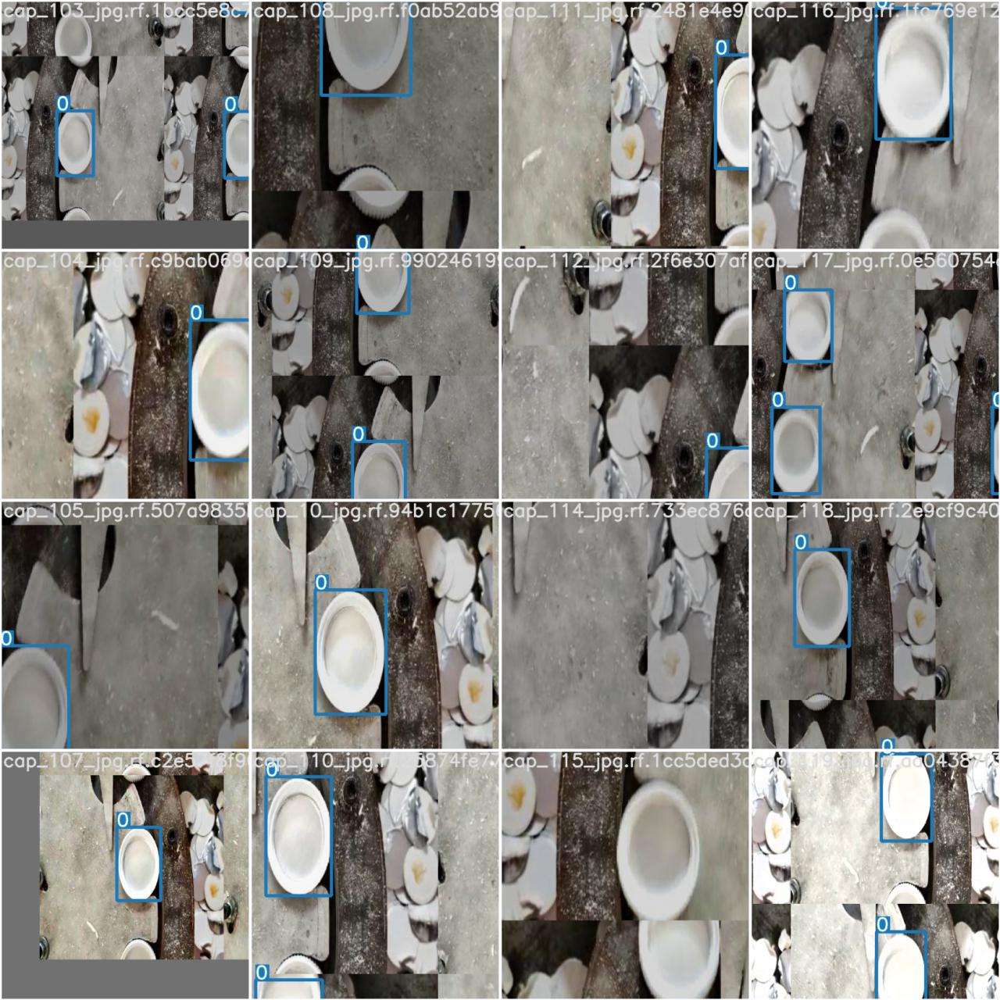

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

In [ ]:
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../test/images', update=False, view_img=False, weights=['runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7246518 parameters, 0 gradients, 16.8 GFLOPS
image 1/20 /content/yolov5/../test/images/cap_100_jpg.rf.04d2e5f139a204fe67ba4a6e318b9352.jpg: 416x416 1 Caps, Done. (0.033s)
image 2/20 /content/yolov5/../test/images/cap_101_jpg.rf.bcafe407a2

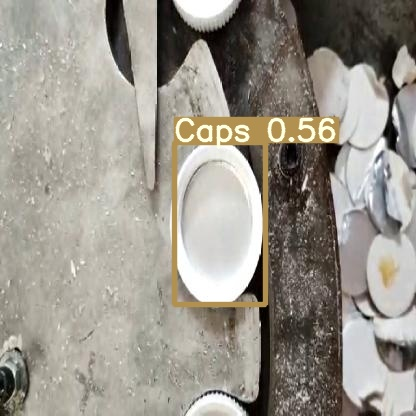

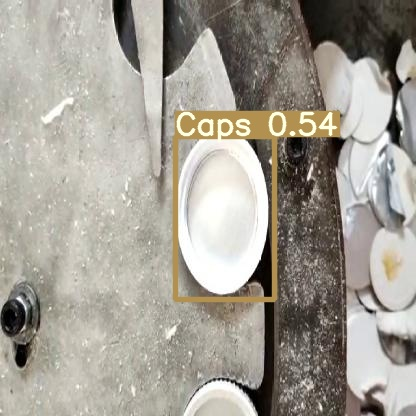

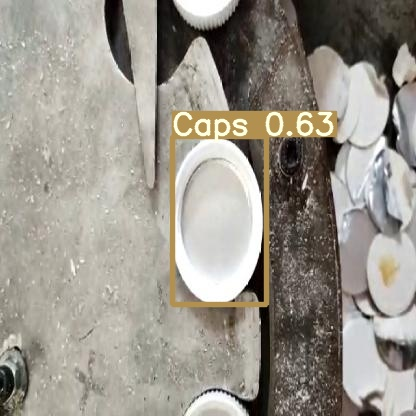

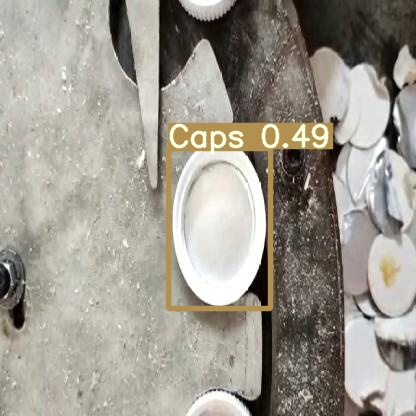

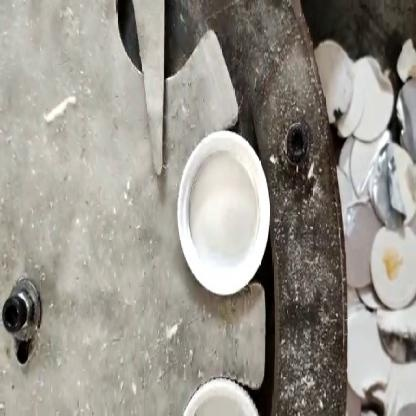

...

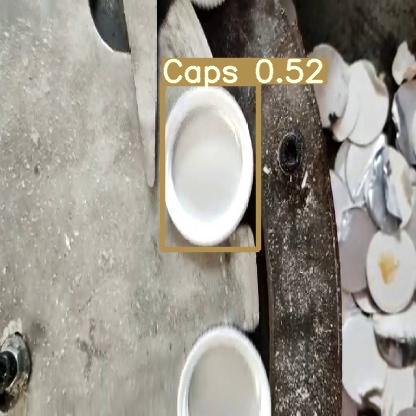

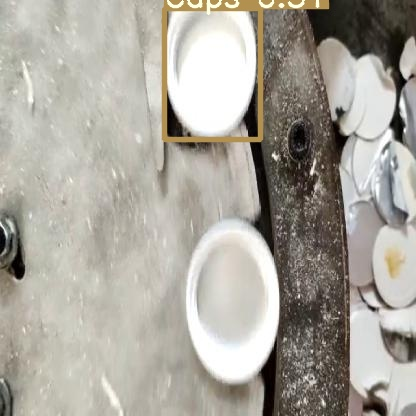

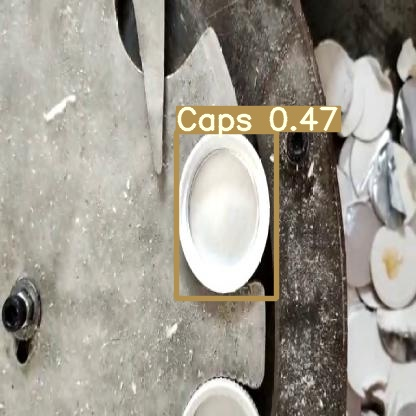

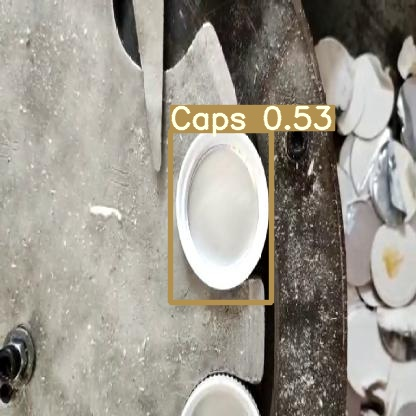

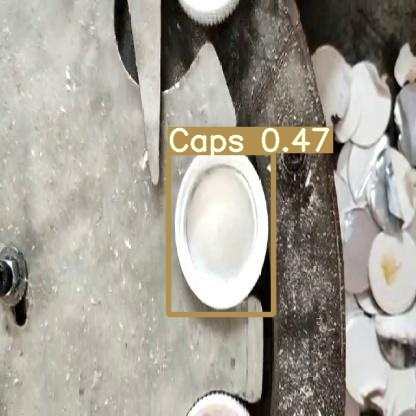

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")